<div class="alert alert-block alert-info">
This notebook would not have been possible without the help and commitment of the open-source software community involved in Pangeo, Xarray, Dask, Numpy, OpenEO, Pandas, GeoPandas. Communities who act in the silence of the universe and make people marvel as they look at the opensource sky.
</div>

# Purpose

This notebook demonstrates how `Pangeo` and `Holoviz` open-source software stack facilitates computing and visualizing the Vegetation Condition Index (VCI) ([1] Kogan, 1995), a well-established indicator to estimate droughts from remote sensing data.

VCI compares the current normalized difference vegetation index (NDVI) \[2] to the range of values observed in previous years.

We will use Sentinel-3 NDVI Analisis Ready Data (ARD) and Long Term Statistics (1999-2019) product provided by the Copernicus Global Land Service \[3].

Both datasets are discovered through the OpenEO API\[5] from the CGLS distributor VITO \[4] and an [EGI registration](https://aai.egi.eu/) is needed.

Further info about drought indexes can be found in the Integrated Drought Management Programme \[5]

\[1] [Application of vegetation index and brightness temperature for drought detection](https://www.sciencedirect.com/science/article/abs/pii/027311779500079T)
\[2] [NDVI](https://en.wikipedia.org/wiki/Normalized_difference_vegetation_index)
\[3] [Copernicus Global Land Service](https://land.copernicus.eu/global/index.html)
\[4] [Vito](https://vito.be/en)
\[5] [OpenEO](https://openeo.org/)
\[5] [Integrated Drought Management](https://www.droughtmanagement.info/indices)

# Setup

Let's install `openeo`, an open source interface that facilitates standardized interchange between users and applications of Copernicus and other EO data as hosted by an increasing number of cloud providers.

In [1]:
import pkg_resources
if not any(list(map(lambda i: i.key == 'openeo', pkg_resources.working_set))):
    !pip install openeo

The libraries are grouped by their function with a short comment describing their main purpose. 

In [105]:
# data
import numpy as np #arrays
import pandas as pd #dataframes
import xarray as xr #multidimensional arrays
import geopandas as gpd #geospatial vector data
import openeo
import zarr

# visualization
import matplotlib.pyplot as plt
import holoviews as hv
import hvplot.xarray
import hvplot.pandas

# Data import

## Selection of Area of interest (AOI)

We define the area of interest from the Global Administrative Unit Layers [GAUL G2015_2014](https://data.apps.fao.org/map/catalog/srv/eng/catalog.search#/metadata/9c35ba10-5649-41c8-bdfc-eb78e9e65654) provided by FAO-UN (see [Documentation](https://data.apps.fao.org/map/catalog/srv/api/records/9c35ba10-5649-41c8-bdfc-eb78e9e65654/attachments/GAUL2015_Documentation.zip)).

The original dataset is distributed in shapefile format. Let's import it using [`GeoPandas`](https://geopandas.org/en/stable/), a python-based library extending the capabilities of [`Pandas`](https://pandas.pydata.org/) to deal with geometry and spatial operations.

In [106]:
GAUL = gpd.read_file('zip+https://mars.jrc.ec.europa.eu/asap/files/gaul1_asap.zip')

Data are organized in a tabular structure. For each element an index a data (made of columns) and a geometry is defined.

![](./images/dataframe.svg "table")

Geometry are defined through [shapely](https://shapely.readthedocs.io/en/stable/) geometry objects with three different basic classes:

Points | Multi-Points
Lines | Multi-Lines
Polygons | Multi-Polygons

In [107]:
GAUL.head(5)

,asap1_id,name1,name1_shr,name0,asap0_id,name0_shr,km2_tot,km2_crop,km2_range,an_crop,an_range,water_lim,geometry
0,263,Damietta,Damietta,Egypt,79,Egypt,928,550,0,1,0,1,"POLYGON ((31.84469 31.52698, 31.84601 31.52356..."
1,2141,Ninh Binh,Ninh Binh,Viet Nam,134,Viet Nam,1362,1035,80,1,0,0,"POLYGON ((105.77766 20.43617, 105.77976 20.435..."
2,10070,Segen Peoples,Segen Peoples,Ethiopia,185,Ethiopia,6813,382,6288,1,1,1,"POLYGON ((37.90356 5.95984, 37.92241 5.95941, ..."
3,2150,Thai Binh,Thai Binh,Viet Nam,134,Viet Nam,1559,1189,51,1,0,0,"POLYGON ((106.41657 20.71235, 106.41279 20.711..."
4,2001,Tekirdag,Tekirdag,Turkey,49,Turkey,6237,4561,1188,1,1,1,"POLYGON ((28.16894 41.47137, 28.18175 41.46005..."


Slicing and sub-setting can be achieved through the same semantic as in `Pandas`. In the cell below, we subset the polygon geometry in which `name1` field equals to `Lombardia`.

In [108]:
AOI_name = 'Lombardia'
AOI = GAUL[GAUL.name1 == AOI_name]
AOI_poly = AOI.geometry

`Geopandas` brings the possibility to interrogate vector-related attributes such as area, bounds, total_bounds, among others.

For a single object, like our AOI, the bounds can inform `max` and `min` coordinates on each axis. If multiple AOIs had been selected then total_bounds returns coordinates, but for the entire `GeoSeries`.

In [110]:
AOI_min_lon, AOI_min_lat, AOI_max_lon, AOI_max_lat = AOI_poly.bounds.values.tolist()[0]

## Data fetch

Datasets can be downloaded directly through the [official portal](https://land.copernicus.eu/global/index.html) but, if not ordered through the legacy portal, files are in the order of 2GB each.

\# There are two main technologies to explore and retread datasets. STAC and openEO. More or less they are similar but here, the VITO's openEO service, at the time of writing, isn't fully compatible with STAC we will
\# rely on openEO.
\# This will make possible to retreat just a portion of data and keep the process affordable even with low connections.

Note: OpenEO is an open application programming interface (API) that connects clients like R, Python and JavaScript to big Earth observation cloud back-ends. More infos [here](https://openeo.org/)
Authentication can be acheived through the [OIDC](https://openid.net/connect/) using the EGI credentials.

The ***BIGGEST*** difference between Xarray (and consequentially Pangeo) and openEO is that Xarray is ***domain-agnostic*** instead openEO, as the name suggest, is dedicated to the analysis of Earth Observation data.

In [111]:
session = openeo.connect("https://openeo.vito.be").authenticate_oidc(provider_id="egi")

Authenticated using refresh token.


As all the libraries there is a catalog of the products that here are named as Collections.

In [112]:
session.list_collections()

[{'description': 'Sentinel 1 GRD Sigma0, mosaic of all ascending relative orbits. Backscatter values are provided as natural number, not in decibel. Provided by Terrascope.\n\n Use [this viewer](https://viewer.terrascope.be/?language=en&bbox=2.8531494643539195,50.29627033037724,6.36877446435392,51.454777120718546&overlay=true&bgLayer=Satellite&date=2020-10-15&layer=CGS_S1_GRD_SIGMA0) to explore the data.',
  'extent': {'spatial': {'bbox': [[-180, -56, 180, 83]]},
   'temporal': {'interval': [['2015-07-06T00:00:00Z', None]]}},
  'id': 'S1_GRD_SIGMA0_ASCENDING',
  'keywords': ['VITO',
   'TERRASCOPE',
   'COPERNICUS',
   'ESA',
   'Orthoimagery',
   'SENTINEL-1',
   'C-SAR',
   'Level-3',
   'Radar',
   'Radar Backscatter'],
  'license': 'free',
  'links': [{'href': 'https://docs.terrascope.be/#/DataProducts/Sentinel-1/ProductsOverview',
    'rel': 'alternate',
    'title': 'Product web page.'},
   {'href': 'https://services.terrascope.be/wmts/v2',
    'rel': 'wmts',
    'wmts:layer': 'CGS_S1_GRD_SIGMA0'}],
  'providers': [{'name': 'Terrascope/VITO'}],
  'stac_extensions': ['datacube'],
  'stac_version': '0.9.0',
  'title': 'Sentinel 1 GRD Sigma0 product, VH, VV and angle.'},
 {'description': 'Sentinel 1 GRD Sigma0, mosaic of all descending relative orbits. Backscatter values are provided as natural number, not in decibel. Provided by Terrascope.\n\n Use [this viewer](https://viewer.terrascope.be/?language=en&bbox=2.8531494643539195,50.29627033037724,6.36877446435392,51.454777120718546&overlay=true&bgLayer=Satellite&date=2020-10-15&layer=CGS_S1_GRD_SIGMA0) to explore the data.',
  'extent': {'spatial': {'bbox': [[-180, -56, 180, 83]]},
   'temporal': {'interval': [['2015-07-06T00:00:00Z', None]]}},
  'id': 'S1_GRD_SIGMA0_DESCENDING',
  'keywords': ['VITO',
   'TERRASCOPE',
   'COPERNICUS',
   'ESA',
   'Orthoimagery',
   'SENTINEL-1',
   'C-SAR',
   'Level-3',
   'Radar',
   'Radar Backscatter'],
  'license': 'free',
  'links': [{'href': 'https://docs.terrascope.be/#/DataProducts/Sentinel-1/ProductsOverview',
    'rel': 'alternate',
    'title': 'Product web page.'},
   {'href': 'https://services.terrascope.be/wmts/v2',
    'rel': 'wmts',
    'wmts:layer': 'CGS_S1_GRD_SIGMA0'}],
  'providers': [{'name': 'Terrascope/VITO'}],
  'stac_extensions': ['datacube'],
  'stac_version': '0.9.0',
  'title': 'Sentinel 1 GRD Sigma0 product, VH, VV and angle.'},
 {'description': 'FAPAR Level-3 product at 10m resolution. Covers selected areas globally. This FAPAR is derived directly from ESA L2A products. The FAPAR quantifies the fraction of the solar radiation absorbed by live leaves for the photosynthesis activity. Then, it refers only to the green and alive elements of the canopy. The FAPAR depends on the canopy structure, vegetation element optical properties, atmospheric conditions, and angular configuration. \n\nFAPAR is recognized as an Essential Climate Variable (ECV) by the Global Climate Observing System (GCOS).',
  'extent': {'spatial': {'bbox': [[-180, -56, 180, 83]]},
   'temporal': {'interval': [['2015-07-06T00:00:00Z', None]]}},
  'id': 'TERRASCOPE_S2_FAPAR_V2',
  'keywords': ['VITO',
   'TERRASCOPE',
   'COPERNICUS',
   'ESA',
   'Orthoimagery',
   'SENTINEL-2',
   'MSI',
   'Level-3',
   'Radiometry',
   'Plant Resource',
   'FAPAR'],
  'license': 'proprietary',
  'links': [{'href': 'https://sentinel.esa.int/documents/247904/690755/Sentinel_Data_Legal_Notice',
    'rel': 'license'},
   {'href': 'https://services.terrascope.be/catalogue/description?collection=urn:eop:VITO:TERRASCOPE_S2_FAPAR_V2',
    'rel': 'alternate'},
   {'href': 'https://viewer.terrascope.be/?language=nl&bbox=0.9339867511378304,50.14520994379217,6.207424251137831,51.77292299745045&overlay=false&bgLayer=MapBox&date=2019-02-25T03:17:15.000Z&layer=CGS_S2_FAPAR',
    'rel': 'alternate',
    'title': 'Terrascope Viewer'},
   {'href': 'https://services.terrascope.be/wmts/v2',
    'rel': 'wmts',
    'wmts:layer': 'CGS_S2_FAPAR'}],
  'providers': [{'name': 'VITO, on

Metadata can be easily explored through a double click on the collection, or it can retract using the function .describe_collection()
'CGLS_NDVI300_V2_GLOBAL' stands for Copernicus Globa Land Service, NDVI index, 300m of nominal resolution, Version 2 of the algorithm and Global means Global coverage.

In [113]:
session.describe_collection('CGLS_NDVI300_V2_GLOBAL')

{'cube:dimensions': {'bands': {'type': 'bands',
   'values': ['NDVI', 'NDVI_unc', 'NOBS', 'QFLAG']},
  't': {'extent': ['2020-07-01T00:00:00Z', None], 'type': 'temporal'},
  'x': {'axis': 'x',
   'extent': [-180, 180],
   'step': 0.002976190476204,
   'type': 'spatial'},
  'y': {'axis': 'y',
   'extent': [-60, 81],
   'step': 0.00297619047619,
   'type': 'spatial'}},
 'description': 'Global NDVI at 300m resolution, 10-daily. The Normalized Difference Vegetation Index (NDVI) is an indicator of the greenness of the biomes. As such, it is closely linked to the FAPAR. The CGLS Collection 300m NDVI V2 product is based on data from the Sentinel-3A and -3B OLCI sensor.',
 'extent': {'spatial': {'bbox': [[-180, -60, 180, 81]]},
  'temporal': {'interval': [['2020-07-01T00:00:00Z', None]]}},
 'id': 'CGLS_NDVI300_V2_GLOBAL',
 'license': 'free',
 'links': [{'href': 'https://land.copernicus.eu/global/products/ndvi',
   'rel': 'alternate',
   'title': 'Product web page.'}],
 'stac_extensions': ['datacube'],
 'stac_version': '0.9.0',
 'summaries': {},
 'title': 'Copernicus Global Land NDVI product V2, 300m resolution, 10-daily'}

Instead of request the entire dataset, to avoid useless transfer, a subset in time, space and band is requested.
In reality this is not going to download anything but is just a pointer to the data on the server.

In [114]:
datacube = session.load_collection(
    'CGLS_NDVI300_V2_GLOBAL',
    spatial_extent={"west": AOI_min_lon, "south":AOI_min_lat , "east": AOI_max_lon, "north":AOI_max_lat },
    temporal_extent = ["2022-01-01", "2022-08-01"],
    bands=['NDVI']
)

To complete the request and trigger the download a specific function has to be called. As output GeoTiff format can be an alternative.
Once loaded with xarray there no evident difference between formats. COG, Geotiff, NetCDF, NetCDF Zarr can be easily read.

In [115]:
datacube.download(f"C_GLS_NDVI_20220101_20220701_{AOI_name}_S3_2.nc", format="NetCDF")

## Basic Concepts

- Dataset and DataArray
- open a NedCDF through Xarray
- understanding the difference between coordinates and dimensions
- Get access to a Variable in a Dataset
- Get access to the attributes
- Selection method
- Plotting

In [116]:
cgls_ds= xr.open_dataset(f'./data/C_GLS_NDVI_20220101_20220701_{AOI_name}_S3_2.nc')

As the dataset is in NetCDF format the system automatically select the correct engine (this underneath has been
conducted through the automatic specification of engine='netcdf'). If the dataset could be in geoTiff format the engine would have been 'rasterio'.
Supposing that you have a dataset in an unrecognised format you can always create your own engine and pass it through the engine parameter.

Having a look to the content

In [117]:
cgls_ds

<xarray.Dataset>
Dimensions:  (t: 20, x: 984, y: 657)
Coordinates:
  * t        (t) datetime64[ns] 2022-01-01 2022-01-11 ... 2022-07-01 2022-07-11
  * x        (x) float64 8.502 8.505 8.508 8.511 ... 11.42 11.42 11.42 11.43
  * y        (y) float64 46.63 46.63 46.63 46.62 ... 44.69 44.69 44.68 44.68
Data variables:
    crs      |S1 ...
    NDVI     (t, y, x) uint8 ...
Attributes:
    Conventions:  CF-1.8
    institution:  openEO platform

How Xarray is structured.

Data array
   - Dimension
   - Coordinates
   - Variables
   - Values
   - Attributes

Data set
    - Attributes


As later on other datasets has dimension named according to the more common triad lat,lon,time a renomination is needed.

In [118]:
cgls_ds = cgls_ds.rename(x='lon', y='lat', t='time')

observe how the nomenclature has changed

In [119]:
cgls_ds

<xarray.Dataset>
Dimensions:  (time: 20, lon: 984, lat: 657)
Coordinates:
  * time     (time) datetime64[ns] 2022-01-01 2022-01-11 ... 2022-07-11
  * lon      (lon) float64 8.502 8.505 8.508 8.511 ... 11.42 11.42 11.42 11.43
  * lat      (lat) float64 46.63 46.63 46.63 46.62 ... 44.69 44.69 44.68 44.68
Data variables:
    crs      |S1 b''
    NDVI     (time, lat, lon) uint8 ...
Attributes:
    Conventions:  CF-1.8
    institution:  openEO platform

DataArray, within Datasets, can be access through the dot notation like  Dataset.NameofVariable

In [120]:
cgls_ds.NDVI

<xarray.DataArray 'NDVI' (time: 20, lat: 657, lon: 984)>
[12929760 values with dtype=uint8]
Coordinates:
  * time     (time) datetime64[ns] 2022-01-01 2022-01-11 ... 2022-07-11
  * lon      (lon) float64 8.502 8.505 8.508 8.511 ... 11.42 11.42 11.42 11.43
  * lat      (lat) float64 46.63 46.63 46.63 46.62 ... 44.69 44.69 44.68 44.68
Attributes:
    long_name:     NDVI
    units:         
    grid_mapping:  crs

Same can be achieved for attributes but instead of a DataArray .attrs will return a dictionary.

In [121]:
cgls_ds.NDVI.attrs

{'long_name': 'NDVI', 'units': '', 'grid_mapping': 'crs'}

Memory must be always taken into account. Each DataArray has an impact on it and to avoid issues like kill the kernel users must avoid to open data bigger than memory.
If the dataset isn't fitting the available memory then the best option would be to load it through the help of Dask in a lazy approach. Later on we will introduce the concept
As the size of the data isn't too big we can continue without any problem.

In [122]:
print(f'{np.round(cgls_ds.NDVI.nbytes / 1024**2, 2)} MB') # all the data are automatically loaded into memory

12.33 MB


#### Selection methods

As underneath DataArrays are Numpy Array (that implements the standard Python x[obj] (x: array, obj: int,slice ) syntax) data can be retreated through the same approach of numpy indexing.

In [123]:
cgls_ds.NDVI[0,100,100]

<xarray.DataArray 'NDVI' ()>
array(87, dtype=uint8)
Coordinates:
    time     datetime64[ns] 2022-01-01
    lon      float64 8.799
    lat      float64 46.34
Attributes:
    long_name:     NDVI
    units:         
    grid_mapping:  crs

or slicing

In [124]:
cgls_ds.NDVI[0:5,100:110,100:110]

<xarray.DataArray 'NDVI' (time: 5, lat: 10, lon: 10)>
array([[[ 87,   0, ..., 255,  76],
        [114,   0, ...,  47,  45],
        ...,
        [ 81,  82, ..., 255, 255],
        [ 98,  96, ..., 255, 255]],

       [[118, 116, ...,  38,  60],
        [132,   0, ...,  23,  25],
        ...,
        [115, 121, ..., 255, 255],
        [105, 120, ..., 255, 255]],

       ...,

       [[103,  95, ...,   4, 255],
        [133,  70, ...,  20,   6],
        ...,
        [  0,  17, ...,  88,  79],
        [129, 129, ..., 255,  39]],

       [[ 37,  38, ..., 255, 255],
        [116,  33, ...,  17,   7],
        ...,
        [255, 172, ...,  95,  72],
        [255,   0, ..., 255,  60]]], dtype=uint8)
Coordinates:
  * time     (time) datetime64[ns] 2022-01-01 2022-01-11 ... 2022-02-11
  * lon      (lon) float64 8.799 8.802 8.805 8.808 ... 8.817 8.82 8.823 8.826
  * lat      (lat) float64 46.34 46.33 46.33 46.33 ... 46.32 46.32 46.31 46.31
Attributes:
    long_name:     NDVI
    units:         
    grid_mapping:  crs

As isn't really easy to remember the order of dimensions Xarray can really help making possible to select the position using names

.isel -> selection based on positional index
.sel  -> selection based on coordinates

A single point can be selected through the positional index and the dimension names

In [125]:
cgls_ds.NDVI.isel(time=0, lat=100, lon=100) # same as cgls_ds.NDVI[:,-1,0]

<xarray.DataArray 'NDVI' ()>
array(87, dtype=uint8)
Coordinates:
    time     datetime64[ns] 2022-01-01
    lon      float64 8.799
    lat      float64 46.34
Attributes:
    long_name:     NDVI
    units:         
    grid_mapping:  crs

The more common way to select a point is through the labeled coordinate using the .sel method.
Coordinates are always affected by precision issue so the best option would be to use the sampling method that will search for the closest point according to the method requested.

Option for the method are:
pad / ffill: propagate last valid index value forward
backfill / bfill: propagate next valid index value backward
nearest: use nearest valid index value

Another important parameter that can be set is the tolerance that specify the distance between original and the target. (abs(index\[indexer] - target) <= tolerance) from [documentation](https://xarray.pydata.org/en/v0.17.0/generated/xarray.DataArray.sel.html#:~:text=xarray.DataArray.sel%20%C2%B6%20DataArray.sel%28indexers%3DNone%2C%20method%3DNone%2C%20tolerance%3DNone%2C%20drop%3DFalse%2C%20%2A%2Aindexers_kwargs%29%20%C2%B6,this%20method%20should%20use%20labels%20instead%20of%20integers.)

In [126]:
cgls_ds.NDVI.sel(time='2022-01-01')

<xarray.DataArray 'NDVI' (lat: 657, lon: 984)>
[646488 values with dtype=uint8]
Coordinates:
    time     datetime64[ns] 2022-01-01
  * lon      (lon) float64 8.502 8.505 8.508 8.511 ... 11.42 11.42 11.42 11.43
  * lat      (lat) float64 46.63 46.63 46.63 46.62 ... 44.69 44.69 44.68 44.68
Attributes:
    long_name:     NDVI
    units:         
    grid_mapping:  crs

time dimension is easy to be used as there is a 1 to 1 correspondence with value in the indexed, float values are not that easy to be use and a small difference makes a big difference in results.

In [127]:
cgls_ds.NDVI.sel(lat=8.79935614, lon=46.33611286)

KeyError: "not all values found in index 'lat'. Try setting the `method` keyword argument (example: method='nearest')."

Original values are much longer to the one represented

In [128]:
cgls_ds.NDVI[0,100,100].lon.values.item()

8.799356142858498

In [129]:
cgls_ds.NDVI[0,100,100].lat.values.item()

46.336112857142965

In [130]:
cgls_ds.NDVI.sel(lat='46.336112857142965', lon='8.799356142858498')

<xarray.DataArray 'NDVI' (time: 20)>
array([ 87, 118,  71, 103,  37,  79,  91,  72,  84,  98, 118, 142, 132, 182,
       206, 228, 239, 181, 221, 230], dtype=uint8)
Coordinates:
  * time     (time) datetime64[ns] 2022-01-01 2022-01-11 ... 2022-07-11
    lon      float64 8.799
    lat      float64 46.34
Attributes:
    long_name:     NDVI
    units:         
    grid_mapping:  crs

To make life easier a method can be selected to deal with inexact matches

In [186]:
POI_lat = 45.88 ; POI_lon = 8.63

In [132]:
cgls_ds.NDVI.sel(lat=POI_lat, lon=POI_lon, method='nearest')

<xarray.DataArray 'NDVI' (time: 20)>
array([255, 255, 255, 255, 255, 255, 255,   9,   4,  10,   2,   1, 215, 201,
       169, 178, 194, 125, 206, 219], dtype=uint8)
Coordinates:
  * time     (time) datetime64[ns] 2022-01-01 2022-01-11 ... 2022-07-11
    lon      float64 8.63
    lat      float64 46.63
Attributes:
    long_name:     NDVI
    units:         
    grid_mapping:  crs

As the exercise is more focus to an Area Of Interest this can be obtained through a bounding box defined with slices.

In [133]:
NDVI_AOI = cgls_ds.NDVI.sel(lat=slice(AOI_max_lat,AOI_min_lat), lon=slice(AOI_min_lon,AOI_max_lon))

#### Plotting
Plotting data can be easily obtained through matplotlib.pyplot back-end [matplotlib documentation](https://matplotlib.org/stable/index.html)

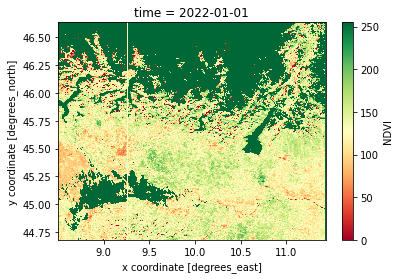

In [134]:
NDVI_AOI.isel(time=0).plot(cmap="RdYlGn")

Or through the HoloViews back-end thanks to the hvplot that acts as high-level plotting API

In [155]:
NDVI_AOI[0].hvplot(cmap="RdYlGn", width=800, height=700)

:Image   [lon,lat]   (NDVI)

Having a look to data distribution can reveal a lot about data

In [156]:
NDVI_AOI[0].hvplot.hist(cmap="RdYlGn",bins=25, width=800, height=700)

:NdOverlay   [Element]
   :Histogram   [NDVI]   (NDVI_count)

Values are a little odd in comparison with standard NDVI range values \[-1, +1]. This finds confirmation on the max values reported in the [Product User Manual](https://land.copernicus.eu/global/sites/cgls.vito.be/files/products/CGLOPS1_PUM_NDVI300m-V2_I1.20.pdf) (PUM)

## NDVI characteristics from the Product User Manual (PUM)

| layer name  | description                             | physical min | physical max | digital max | scaling | offset | No Data  |
|-------------|-----------------------------------------|--------------|--------------|-------------|---------|--------|----------|
| ndvi        | normalized difference vegetation index  | -0.08        | 0.92         | 250         | 1/250   | -0.08  | 254, 255 |
| ndvi_unc    | uncertainty on ndvi                     | 0            | 1            | 1000        | 1/1000  | 0      | 65535    |
| nobs        | number of observations                  | 0	           | 32           | 32          | 1       | 0      | 255      |
| qflag       | bitwise quality flag                    | -            | -            | 254         | 1       | 0      | 255      |


from : [Copernicus Global Land Service NDVI 300 V2.0.1](https://land.copernicus.eu/global/sites/cgls.vito.be/files/products/CGLOPS1_PUM_NDVI300m-V2_I1.20.pdf)

## Basic Computations

- Arithmetics
- Reductions

Simple arithmetic can be obtained without worry about dimensions and coordinates. Automatically the numpy component will take to vectorize over all array values

In [157]:
NDVI = cgls_ds.NDVI * (1/250) - 0.08

In [158]:
NDVI

<xarray.DataArray 'NDVI' (time: 20, lat: 657, lon: 984)>
array([[[0.94 , 0.94 , 0.94 , ..., 0.94 , 0.94 , 0.94 ],
        [0.94 , 0.94 , 0.94 , ..., 0.94 , 0.94 , 0.94 ],
        [0.94 , 0.94 , 0.94 , ..., 0.94 , 0.94 , 0.94 ],
        ...,
        [0.252, 0.32 , 0.316, ..., 0.416, 0.352, 0.94 ],
        [0.404, 0.4  , 0.368, ..., 0.416, 0.412, 0.94 ],
        [0.372, 0.292, 0.292, ..., 0.244, 0.4  , 0.94 ]],

       [[0.94 , 0.94 , 0.94 , ..., 0.94 , 0.94 , 0.94 ],
        [0.94 , 0.94 , 0.94 , ..., 0.94 , 0.94 , 0.94 ],
        [0.94 , 0.94 , 0.94 , ..., 0.94 , 0.94 , 0.94 ],
        ...,
        [0.472, 0.432, 0.416, ..., 0.484, 0.464, 0.94 ],
        [0.448, 0.412, 0.392, ..., 0.56 , 0.528, 0.94 ],
        [0.444, 0.424, 0.4  , ..., 0.484, 0.496, 0.94 ]],

       [[0.94 , 0.94 , 0.94 , ..., 0.94 , 0.94 , 0.94 ],
        [0.94 , 0.94 , 0.94 , ..., 0.94 , 0.94 , 0.94 ],
        [0.94 , 0.94 , 0.94 , ..., 0.94 , 0.94 , 0.94 ],
        ...,
...
        ...,
        [0.484, 0.484, 0.54 , ..., 0.424, 0.484, 0.94 ],
        [0.452, 0.424, 0.484, ..., 0.488, 0.52 , 0.94 ],
        [0.432, 0.408, 0.392, ..., 0.72 , 0.64 , 0.94 ]],

       [[0.94 , 0.94 , 0.94 , ..., 0.66 , 0.68 , 0.94 ],
        [0.044, 0.044, 0.94 , ..., 0.684, 0.708, 0.94 ],
        [0.94 , 0.94 , 0.94 , ..., 0.712, 0.692, 0.94 ],
        ...,
        [0.54 , 0.56 , 0.604, ..., 0.268, 0.296, 0.94 ],
        [0.488, 0.52 , 0.536, ..., 0.448, 0.516, 0.94 ],
        [0.464, 0.48 , 0.532, ..., 0.564, 0.432, 0.94 ]],

       [[0.94 , 0.94 , 0.94 , ..., 0.648, 0.648, 0.94 ],
        [0.94 , 0.94 , 0.94 , ..., 0.7  , 0.708, 0.94 ],
        [0.94 , 0.94 , 0.94 , ..., 0.696, 0.708, 0.94 ],
        ...,
        [0.58 , 0.568, 0.568, ..., 0.392, 0.4  , 0.94 ],
        [0.584, 0.532, 0.528, ..., 0.548, 0.548, 0.94 ],
        [0.556, 0.484, 0.488, ..., 0.62 , 0.584, 0.94 ]]])
Coordinates:
  * time     (time) datetime64[ns] 2022-01-01 2022-01-11 ... 2022-07-11
  * lon      (lon) float64 8.502 8.505 8.508 8.511 ... 11.42 11.42 11.42 11.43
  * lat      (lat) float64 46.63 46.63 46.63 46.62 ... 44.69 44.69 44.68 44.68

Same result can be achieved using the usual numpy functions.

In [159]:
NDVI_ = np.subtract(np.multiply(cgls_ds.NDVI, (1/250)), 0.08)

In [160]:
NDVI_

<xarray.DataArray 'NDVI' (time: 20, lat: 657, lon: 984)>
array([[[0.94 , 0.94 , 0.94 , ..., 0.94 , 0.94 , 0.94 ],
        [0.94 , 0.94 , 0.94 , ..., 0.94 , 0.94 , 0.94 ],
        [0.94 , 0.94 , 0.94 , ..., 0.94 , 0.94 , 0.94 ],
        ...,
        [0.252, 0.32 , 0.316, ..., 0.416, 0.352, 0.94 ],
        [0.404, 0.4  , 0.368, ..., 0.416, 0.412, 0.94 ],
        [0.372, 0.292, 0.292, ..., 0.244, 0.4  , 0.94 ]],

       [[0.94 , 0.94 , 0.94 , ..., 0.94 , 0.94 , 0.94 ],
        [0.94 , 0.94 , 0.94 , ..., 0.94 , 0.94 , 0.94 ],
        [0.94 , 0.94 , 0.94 , ..., 0.94 , 0.94 , 0.94 ],
        ...,
        [0.472, 0.432, 0.416, ..., 0.484, 0.464, 0.94 ],
        [0.448, 0.412, 0.392, ..., 0.56 , 0.528, 0.94 ],
        [0.444, 0.424, 0.4  , ..., 0.484, 0.496, 0.94 ]],

       [[0.94 , 0.94 , 0.94 , ..., 0.94 , 0.94 , 0.94 ],
        [0.94 , 0.94 , 0.94 , ..., 0.94 , 0.94 , 0.94 ],
        [0.94 , 0.94 , 0.94 , ..., 0.94 , 0.94 , 0.94 ],
        ...,
...
        ...,
        [0.484, 0.484, 0.54 , ..., 0.424, 0.484, 0.94 ],
        [0.452, 0.424, 0.484, ..., 0.488, 0.52 , 0.94 ],
        [0.432, 0.408, 0.392, ..., 0.72 , 0.64 , 0.94 ]],

       [[0.94 , 0.94 , 0.94 , ..., 0.66 , 0.68 , 0.94 ],
        [0.044, 0.044, 0.94 , ..., 0.684, 0.708, 0.94 ],
        [0.94 , 0.94 , 0.94 , ..., 0.712, 0.692, 0.94 ],
        ...,
        [0.54 , 0.56 , 0.604, ..., 0.268, 0.296, 0.94 ],
        [0.488, 0.52 , 0.536, ..., 0.448, 0.516, 0.94 ],
        [0.464, 0.48 , 0.532, ..., 0.564, 0.432, 0.94 ]],

       [[0.94 , 0.94 , 0.94 , ..., 0.648, 0.648, 0.94 ],
        [0.94 , 0.94 , 0.94 , ..., 0.7  , 0.708, 0.94 ],
        [0.94 , 0.94 , 0.94 , ..., 0.696, 0.708, 0.94 ],
        ...,
        [0.58 , 0.568, 0.568, ..., 0.392, 0.4  , 0.94 ],
        [0.584, 0.532, 0.528, ..., 0.548, 0.548, 0.94 ],
        [0.556, 0.484, 0.488, ..., 0.62 , 0.584, 0.94 ]]])
Coordinates:
  * time     (time) datetime64[ns] 2022-01-01 2022-01-11 ... 2022-07-11
  * lon      (lon) float64 8.502 8.505 8.508 8.511 ... 11.42 11.42 11.42 11.43
  * lat      (lat) float64 46.63 46.63 46.63 46.62 ... 44.69 44.69 44.68 44.68
Attributes:
    long_name:     NDVI
    units:         
    grid_mapping:  crs

## Statistics

In [161]:
NDVI.min()

<xarray.DataArray 'NDVI' ()>
array(-0.08)

In [162]:
NDVI.max(dim='time')

<xarray.DataArray 'NDVI' (lat: 657, lon: 984)>
array([[0.94 , 0.94 , 0.94 , ..., 0.94 , 0.94 , 0.94 ],
       [0.94 , 0.94 , 0.94 , ..., 0.94 , 0.94 , 0.94 ],
       [0.94 , 0.94 , 0.94 , ..., 0.94 , 0.94 , 0.94 ],
       ...,
       [0.596, 0.584, 0.604, ..., 0.728, 0.804, 0.94 ],
       [0.584, 0.604, 0.588, ..., 0.708, 0.68 , 0.94 ],
       [0.556, 0.528, 0.532, ..., 0.72 , 0.64 , 0.94 ]])
Coordinates:
  * lon      (lon) float64 8.502 8.505 8.508 8.511 ... 11.42 11.42 11.42 11.43
  * lat      (lat) float64 46.63 46.63 46.63 46.62 ... 44.69 44.69 44.68 44.68

## Aggregation

In [163]:
NDVI_monthly = NDVI.groupby(NDVI.time.dt.month).mean()

In [164]:
NDVI_monthly.month

<xarray.DataArray 'month' (month: 7)>
array([1, 2, 3, 4, 5, 6, 7], dtype=int64)
Coordinates:
  * month    (month) int64 1 2 3 4 5 6 7

## Mask

Not all values are valid and masking all the once not in the valid range \[-0.08, 0.92] is mandatory. Masking can be achieved through the method DataSet|Array.where(cond, other) or xr.where(cond, x, y)
The difference consist in the possibility to specify the value in case the condition is positive or not; .where doesn't give this possibility.

In [165]:
NDVI_msked = NDVI.where((NDVI >= -0.08) & (NDVI <= 0.92)) # by default where condition is false values are set to NA

To better visualize the mask with the help of xr.where a specific variable can be constructed.

In [166]:
NDVI_msk = xr.where((NDVI <= -0.08) | (NDVI >= 0.92), 1, 0)

In [170]:
NDVI_msked.hvplot(groupby ='time', cmap="RdYlGn", width=800, height=700) * AOI.hvplot(geo=True)

:Overlay
   .Image.I    :Image   [lon,lat]   (NDVI)
   .Polygons.I :Polygons   [lon,lat]

In [45]:
NDVI_msk.hvplot(groupby = 'time', cmap="RdYlGn", width=800, height=700)

:DynamicMap   [time]
   :Image   [lon,lat]   (NDVI)

Plot a single point over the time dimension

In [46]:
NDVI_msked.sel(lat=POI_lat, lon=POI_lon, method='nearest')\
    .hvplot(ylim=(-0.08, 0.92))

:Curve   [time]   (NDVI)

### Interpolation of nans
As the selection has reviled that there are some non-valid values Nans can be directly interpolated through the help of [scipy interpolation](https://docs.scipy.org/doc/scipy/tutorial/interpolate.html)

In [47]:
NDVI_msked.sel(lat=POI_lat, lon=POI_lon, method='nearest')\
    .interpolate_na('time', method='linear')\
    .hvplot(ylim=(-0.08, 0.92))

:Curve   [time]   (NDVI)

Same can be applied as well over the time dimension

In [48]:
NDVI_interp = NDVI_msked.interpolate_na('time', method='linear', max_gap=pd.to_timedelta(31, 'd'))

## Clipping data according to a polygon

one of the basic concept in GIS is to clip data using a vector geometry. Xarray isn't directly capable of dealing with vectors but thanks to rioxarray can be easily achieved
Rioxarray extends Xarray with all most of the plus that Rasterio (GDAL) brings.

First step that has to be defined is the reference system

In [49]:
NDVI_msked = NDVI_interp.rio.write_crs(4326)

Once this has been done we can clip data with the polygon that has been read through geopandas at the beginning of the notebook.

In [50]:
NDVI_AOI = NDVI_msked.rio.clip(AOI_poly, crs=4326)

Once data is limited to the AOI a histogram can be added to the visualization.

In [ ]:
NDVI_AOI.hvplot(groupby='time', cmap='RdYlGn', width=800, height=700 ).hist()

In [181]:
NDVI_AOI

<xarray.DataArray 'NDVI' (time: 20, lat: 657, lon: 984)>
[12929760 values with dtype=uint8]
Coordinates:
  * time     (time) datetime64[ns] 2022-01-01 2022-01-11 ... 2022-07-11
  * lon      (lon) float64 8.502 8.505 8.508 8.511 ... 11.42 11.42 11.42 11.43
  * lat      (lat) float64 46.63 46.63 46.63 46.62 ... 44.69 44.69 44.68 44.68
Attributes:
    long_name:     NDVI
    units:         
    grid_mapping:  crs

In [52]:
#Proposal : start region '02_Introduction_to_Dask'

### Introduction to the Long Term statistics

CGLS LTS are computed over a time span of 20 years aggregated over each 10 days period (month/01,month/11, month/21). For each date the long term minimum, maximum, mean, median and standard deviation are computed.

In [53]:
NDVI_LTS = xr.open_dataset(rf'.\data\CopernicusGlobalLand\LTS\c_gls_NDVI-LTS_1999-2019-0101_GLOBE_VGT-PROBAV_V3.0.1.nc')

In [54]:
NDVI_LTS.sel(lat=POI_lat, lon=POI_lon, method='nearest')['min'].values

array(-0.068, dtype=float32)

In [55]:
LTS = xr.open_mfdataset(rf'.\data\CopernicusGlobalLand\LTS\*.nc', combine='nested', concat_dim=['time'], decode_coords="all")

In [56]:
LTS

C:\Users\Pier\.conda\envs\FOSS4G\lib\site-packages\dask\array\core.py:1627: RuntimeWarning: overflow encountered in long_scalars
  cbytes = format_bytes(np.prod(self.chunksize) * self.dtype.itemsize)


<xarray.Dataset>
Dimensions:  (lon: 40320, lat: 15680, time: 36)
Coordinates:
  * lon      (lon) float64 -180.0 -180.0 -180.0 -180.0 ... 180.0 180.0 180.0
  * lat      (lat) float64 80.0 79.99 79.98 79.97 ... -59.97 -59.98 -59.99
    crs      |S1 b''
Dimensions without coordinates: time
Data variables:
    min      (time, lat, lon) float32 dask.array<chunksize=(1, 15680, 40320), meta=np.ndarray>
    median   (time, lat, lon) float32 dask.array<chunksize=(1, 15680, 40320), meta=np.ndarray>
    max      (time, lat, lon) float32 dask.array<chunksize=(1, 15680, 40320), meta=np.ndarray>
    mean     (time, lat, lon) float32 dask.array<chunksize=(1, 15680, 40320), meta=np.ndarray>
    stdev    (time, lat, lon) float32 dask.array<chunksize=(1, 15680, 40320), meta=np.ndarray>
    nobs     (time, lat, lon) float32 dask.array<chunksize=(1, 15680, 40320), meta=np.ndarray>
Attributes: (12/19)
    Conventions:          CF-1.6
    parent_identifier:    urn:cgls:global:ndvi_stats_all
    identifier:           urn:cgls:global:ndvi_stats_all:NDVI-LTS_1999-2019-0...
    long_name:            Normalized Difference Vegetation Index
    title:                Normalized Difference Vegetation Index: Long Term S...
    product_version:      V3.0.1
    ...                   ...
    source:               Derived from EO satellite imagery
    processing_mode:      Offline
    references:           https://land.copernicus.eu/global/products/ndvi
    copyright:            Copernicus Service information 2021
    archive_facility:     VITO
    history:              2021-03-01 - Processing line NDVI LTS

Note! If you use one of xarray’s open methods such as xarray.open_dataset to load netCDF files with the default engine, it is recommended to use decode_coords=”all”. This will load the grid mapping variable into coordinates for compatibility with rioxarray. From [rioxarray documentation](https://corteva.github.io/rioxarray/stable/getting_started/getting_started.html#xarray)


In [178]:
LTS = LTS.rio.write_crs(4326)

In [179]:
LTS = LTS.sel(lat=slice(AOI_max_lat,AOI_min_lat) ,lon=slice(AOI_min_lon,AOI_max_lon))

In [ ]:
LTS = LTS.rio.clip(AOI_poly, crs=4326)

In [182]:
LTS

<xarray.Dataset>
Dimensions:      (lat: 219, lon: 327, time: 36)
Coordinates:
  * lat          (lat) float64 46.63 46.63 46.62 46.61 ... 44.71 44.7 44.69
  * lon          (lon) float64 8.509 8.518 8.527 8.536 ... 11.4 11.41 11.42
    spatial_ref  int32 ...
  * time         (time) datetime64[ns] 2022-01-01 2022-01-11 ... 2022-12-21
    crs          int32 0
Data variables:
    max          (time, lat, lon) float32 dask.array<chunksize=(36, 152, 227), meta=np.ndarray>
    mean         (time, lat, lon) float32 dask.array<chunksize=(36, 152, 227), meta=np.ndarray>
    median       (time, lat, lon) float32 dask.array<chunksize=(36, 152, 227), meta=np.ndarray>
    min          (time, lat, lon) float32 dask.array<chunksize=(36, 152, 227), meta=np.ndarray>
    nobs         (time, lat, lon) float32 dask.array<chunksize=(36, 152, 227), meta=np.ndarray>
    stdev        (time, lat, lon) float32 dask.array<chunksize=(36, 152, 227), meta=np.ndarray>
Attributes: (12/19)
    Conventions:          CF-1.6
    archive_facility:     VITO
    copyright:            Copernicus Service information 2021
    history:              2021-03-01 - Processing line NDVI LTS
    identifier:           urn:cgls:global:ndvi_stats_all:NDVI-LTS_1999-2019-0...
    institution:          VITO NV
    ...                   ...
    references:           https://land.copernicus.eu/global/products/ndvi
    sensor:               VEGETATION-1, VEGETATION-2, VEGETATION
    source:               Derived from EO satellite imagery
    time_coverage_end:    2019-12-31T23:59:59Z
    time_coverage_start:  1999-01-01T00:00:00Z
    title:                Normalized Difference Vegetation Index: Long Term S...

In [60]:
LTS = LTS.chunk({'time':-1, 'lat':'5MB', 'lon':'5MB'})

As the time dimension is defined as 'year less' (don't forget that are aggregated values spanning between 1999 and 2019) to let Xarray align values, the index needs to be reformed to the current year.

In [62]:
dates_2022 = pd.date_range('20220101', '20221231')
decadie = dates_2022[np.isin(dates_2022.day, [1,11,21])]
decadie

DatetimeIndex(['2022-01-01', '2022-01-11', '2022-01-21', '2022-02-01',
               '2022-02-11', '2022-02-21', '2022-03-01', '2022-03-11',
               '2022-03-21', '2022-04-01', '2022-04-11', '2022-04-21',
               '2022-05-01', '2022-05-11', '2022-05-21', '2022-06-01',
               '2022-06-11', '2022-06-21', '2022-07-01', '2022-07-11',
               '2022-07-21', '2022-08-01', '2022-08-11', '2022-08-21',
               '2022-09-01', '2022-09-11', '2022-09-21', '2022-10-01',
               '2022-10-11', '2022-10-21', '2022-11-01', '2022-11-11',
               '2022-11-21', '2022-12-01', '2022-12-11', '2022-12-21'],
              dtype='datetime64[ns]', freq=None)

In [63]:
LTS = LTS.assign_coords(time=decadie)

In [174]:
LTS['min'][5].hvplot(geo=True)

:Image   [lon,lat]   (min)

In [187]:
LTS['min'].sel(lat=POI_lat, lon=POI_lon, method='nearest').values

array([0.264     , 0.22400002, 0.244     , 0.14400001, 0.172     ,
       0.14800002, 0.272     , 0.268     , 0.32      , 0.384     ,
       0.43200004, 0.45600003, 0.54800004, 0.58800006, 0.572     ,
       0.66      , 0.6840001 , 0.69600004, 0.6840001 , 0.688     ,
       0.66800004, 0.65200007, 0.64400005, 0.56000006, 0.58400005,
       0.6240001 , 0.58800006, 0.56000006, 0.544     , 0.43200004,
       0.388     , 0.33200002, 0.27600002, 0.33600003, 0.268     ,
       0.32      ], dtype=float32)

In [66]:
LTS.to_zarr(rf'.\data\CopernicusGlobalLand\LTS\c_gls_NDVI-LTS_1999-2019-{AOI_name}_VGT-PROBAV_V3.zarr', mode='w', )

In [67]:
LTS = xr.open_zarr(rf'.\data\CopernicusGlobalLand\LTS\c_gls_NDVI-LTS_1999-2019-{AOI_name}_VGT-PROBAV_V3.zarr')

In [83]:
LTS['min'][0].hvplot(width=800, height=700)

:Image   [lon,lat]   (min)

In [185]:
POI_lat

46.88

In [188]:
LTS_NDVI_POI = LTS.sel(lat=POI_lat, lon=POI_lon, method='nearest')

In [189]:
LTS_NDVI_POI['mean'].values

array([0.37600005, 0.356     , 0.34400004, 0.34000003, 0.34800005,
       0.324     , 0.36400002, 0.388     , 0.43600005, 0.50000006,
       0.56400007, 0.62000006, 0.6840001 , 0.72800004, 0.72800004,
       0.7480001 , 0.75200003, 0.75200003, 0.75200003, 0.75200003,
       0.7480001 , 0.7440001 , 0.73600006, 0.73600006, 0.73200005,
       0.7120001 , 0.69600004, 0.688     , 0.70800006, 0.66400003,
       0.60800004, 0.56000006, 0.49200004, 0.448     , 0.416     ,
       0.40400004], dtype=float32)

In [190]:
POI_min = LTS_NDVI_POI['min']
POI_max = LTS_NDVI_POI['max']
POI_std = LTS_NDVI_POI['stdev']
POI_mean = LTS_NDVI_POI['mean']
POI = NDVI_AOI.sel(lat=POI_lat, lon=POI_lon, method='nearest')

+ merges graphs by putting them next to each other
* overlays graphs on one another to create one single graph combining all individual

In [192]:
(POI.hvplot(width=1000, height=700, label='NDVI') *
 POI_mean.hvplot(c='grey', label='mean LTS 1999-2019', alpha=0.2, line_dash='dashed') *
 POI_min.hvplot(c='b',label='min LTS 1999-2019', alpha=0.2, line_dash='dashed') *
 POI_max.hvplot(c='r', label='Max LTS 1999-2019', alpha=0.2, line_dash='dashed') *
 hv.Area((POI_mean.time, POI_mean - POI_std, POI_mean + POI_std ), vdims=['- Std', '+ Std'], label='Standard deviation LTS 1999-2019',).opts( color='blue', alpha=0.2))\
    .opts(title=f"CGLS S3 300m NDVI fluctuation over the year 2022 in comparison with CGLS Long Term Statistics\nPoint of interest Lat {np.round(POI.lat.data,2)} Lon {np.round(POI.lon.data,2)}",
          legend_position='bottom_right')

:Overlay
   .Curve.NDVI                                         :Curve   [time]   (NDVI)
   .Curve.Mean_LTS_1999_hyphen_minus_2019              :Curve   [time]   (mean)
   .Curve.Min_LTS_1999_hyphen_minus_2019               :Curve   [time]   (min)
   .Curve.Max_LTS_1999_hyphen_minus_2019               :Curve   [time]   (max)
   .Area.Standard_deviation_LTS_1999_hyphen_minus_2019 :Area   [x]   (- Std,+ Std)

Clip the dataset over the AOI

In [ ]:
LTS = LTS.rio.write_crs(4326)

In [ ]:
LTS = LTS.rio.clip(AOI_poly, crs=4326)

The nominal spatial resolution of the Long term statistics is 1km. As the current NDVI product has a nominal spatial resolution of 300m a re projection is needed.
RioXarray through RasterIO that wraps the GDAL method can take care of this.
More info about all the options can be found [here](https://rasterio.readthedocs.io/en/stable/api/rasterio.warp.html#rasterio.warp.reproject)

In [ ]:
NDVI_1k = NDVI_AOI.rio.reproject_match(LTS)

In [ ]:
NDVI_1k.coords

RioXarray does a great job, but it looses the coordinates names. To be able to combine different dataset coords needs to be renamed.

In [ ]:
NDVI_1k = NDVI_1k.rename({'x': 'lon', 'y':'lat'})

In [ ]:
NDVI_1k.coords

In [ ]:
# NDVI_1k = NDVI_1k.where((NDVI_1k >= -0.08) & (NDVI_1k <= 0.92))

In [ ]:
NDVI_1k.hvplot(groupby='time', cmap='RdYlGn', width=800, height=700)

The Vegetation Condition Index (VCI) compares the current NDVI to the range of values observed in the same period in previous years. The VCI is expressed in % and gives an idea where the observed value is situated between the extreme values (minimum and maximum) in the previous years.

In [ ]:
VCI = ((NDVI_1k - LTS['min']) / (LTS['max'] - LTS['min'])) * 100

In [ ]:
VCI.name = 'VCI'

In [ ]:
VCI.isel(time=4).hvplot()

In [ ]:
VCI.sel(lat=POI_lat, lon=POI_lon, method='nearest').hvplot.hist()

In [ ]:
VCI.plot()

In [ ]:
VCI.isel(time=-1).hvplot.contourf(cmap='RdYlGn', alpha=0.7,
                                  levels=[-200,-100,-50, 0,50,100,200],
                                  geo=True, tiles= 'CartoLight',
                                  width=800, height=700,
                                  title=f'CGLS VCI {AOI_name} {VCI.isel(time=-1).time.dt.date.data}')

In [ ]:
# Proposal : Start region 03_Exercise

### Execise: Using the Global Land Cover mask all the urban areas

In [ ]:
session.describe_collection('GLOBAL_LAND_COVER')

In [ ]:
datacube_LC = session.load_collection(
    'GLOBAL_LAND_COVER',
    spatial_extent={"west": AOI_min_lon, "south":AOI_min_lat , "east": AOI_max_lon, "north":AOI_max_lat },
    bands=['Discrete_Classification_map']
)

In [ ]:
datacube_LC.download(f"C_GLS_LC_20220101_20220701_{AOI_name}_PROBA_3.nc", format="NetCDF")

In [ ]:
cgls_LC= xr.open_dataset('C_GLS_LC_20220101_20220701_CENTRALITALY_3.nc')

In [ ]:
LC_2019 = cgls_LC.Discrete_Classification_map.sel(t='2019-01-01')

In [ ]:
LC_2019 = LC_2019.rio.write_crs(4326)

In [ ]:
LC_2019 = LC_2019.rio.reproject_match(LTS)

In [ ]:
LC_2019

In [ ]:
urban_mask = xr.where(LC_2019 == 50, False, True).rename({'x': 'lon', 'y':'lat'})

In [ ]:
urban_mask.hvplot(width=800, height=700)

In [ ]:
VCI_masked = VCI.where(urban_mask) 

In [ ]:
VCI_masked.name = 'VCI masked'

In [ ]:
VCI_masked.isel(time=0).hvplot(cmap='RdYlGn', alpha=0.7,
                                  geo=True, tiles= 'CartoLight',
                                  width=800, height=700,)